In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem Definition:

Identifying the breed of a dog given an image of dog.

When I'm sitting at the cafe and I take a picture of a dog, I want to check what breed of dog it is.
## 2. Data:
The data we're using is from Kaggle's dog breed identification competition.<br>
https://www.kaggle.com/competitions/dog-breed-identification
## 3. Evaluation:
The evaluation is the file with prediction probabilities for each dog breed of each test image. www.kaggle.com/competitions/dog-breed-identification/overview/evaluation
## 4. Features:
Some information about the data.

+ We're dealing with images (unstructured data) so it's probably best we use deep learning / transfer learning.
+ There are 120 breeds of dogs (this means there are 120 different classes).
+ There are around 10,000+ images in the training set (these images have labels) .
+ There are around 10,000+ images in the test set (these images have no labels because we'll want to predict them).


### Get our Workspace ready

+ Import TensorFlow 2.x ✅
+ Import TensorFlow Hub ✅
+ Make sure we're using a GPU ✅

In [1]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availability
print("GPU available :)" if tf.config.list_physical_devices("GPU") else "GPU not available :(")

TF Version: 2.15.0
TF Hub Version: 0.15.0
GPU available :)


## Getting our Data ready (Turning it into tensors)

With all Machine Learning models, our data has to be in numerical format. So thats what we'll be doing first. Turning our images into Tensors (numerical representations)

Let's start by accessing our data and checking out the labels.

In [3]:
# Checkout the labels of our data
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")

In [4]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [5]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


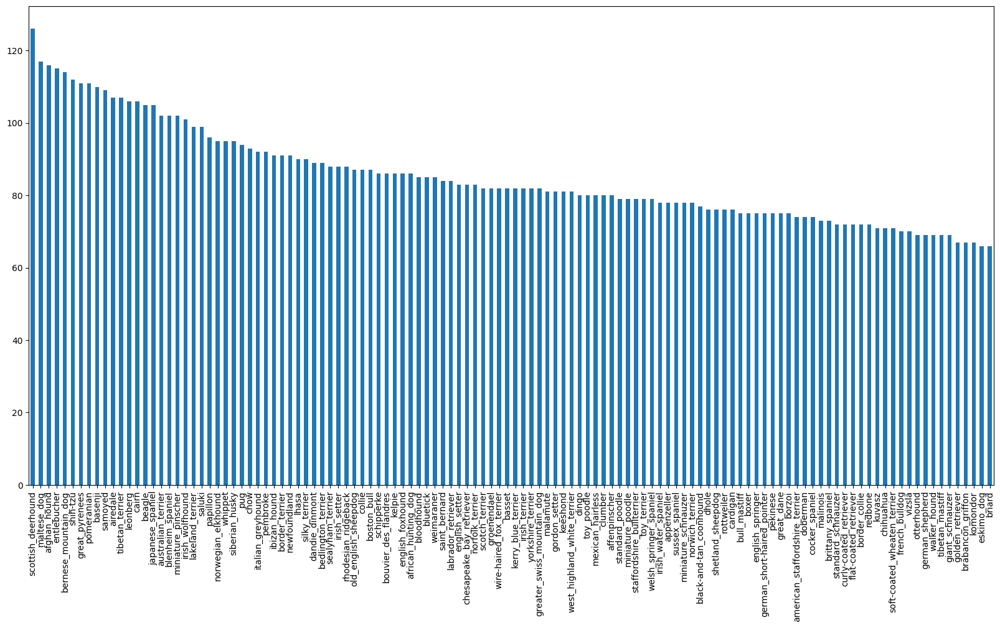

In [7]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [8]:
labels_csv["breed"].value_counts().median()

82.0

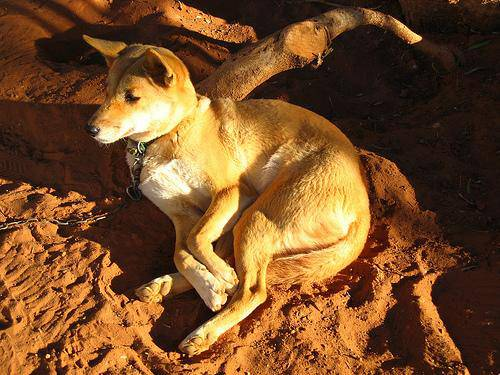

In [9]:
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# This code is a basic check to ensure that the number of filenames you have matches the actual number of files in the specified directory.
# It can be useful when working with datasets to confirm that you have the expected number of files before proceeding with further processing.

In [12]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# Check whether the number of filenames matches the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):  # os.listdir() -> Returns a list of the names of the entries in a directory
  print("filenames match actual amount of files !!! Proceed.")
else:
  print("filenames do not match actual amount of files, check the target directory")

filenames match actual amount of files !!! Proceed.


In [ ]:
len(filenames)

10222

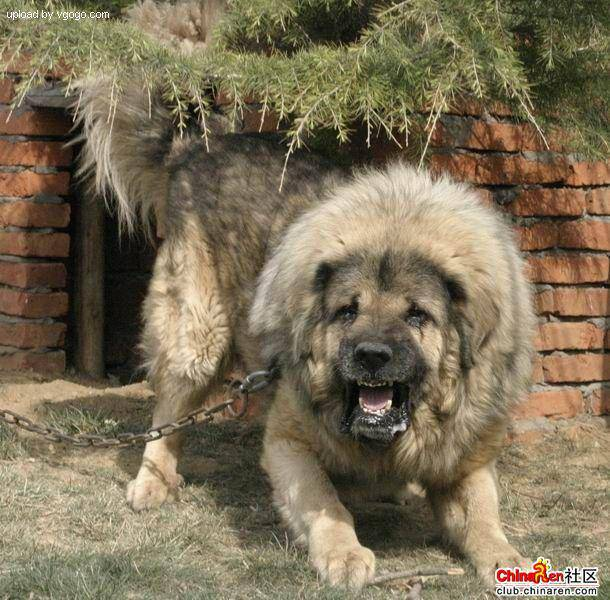

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels.

In [29]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)  # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if the number of labels matches the number of filenames  (to check missing values)
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames! ")
else:
  print("Number of labels does not matches the number of filenames, check data directories !")

Number of labels matches the number of filenames! 


In [30]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds  # compares a target value(label) with unique list

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean labels into integers
print(labels[0])  # original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax())  # index where label occurs in boolean array: Returns the indices of the maximum values along an axis
print(boolean_labels[0].astype(int))  # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed as it takes too long to train on a huge dataset .

Working with large image datasets in deep learning can be computationally intensive and time-consuming. Initially, reducing the dataset size to a manageable number, such as 1000 images, can be a practical approach

In [ ]:
# Set the number of images to be used for experimenting
NUM_IMAGES = 1000  #@param {type:"slider", min:1000, max:10000, step:1000}

# this is a magic function in colab it says hey! NUM_IMAGES is a parameter and we can set its value through slider

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it into a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image`(convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.

You might be wondering why (224, 224), which is (heigh, width). It's because this is the size of input our model (we'll see this soon) takes, an image which is (224, 224, 3).

What? Where's the 3 from? We're getting ahead of ourselves but that's the number of colour channels per pixel, red, green and blue. RGB (color values ranges from 0-255)

Let's make this a little more concrete.

In [34]:
from matplotlib.pyplot import imread
image = imread(filenames[42])  # read in an image
image.shape

(257, 350, 3)

Notice the shape of `image`. It's (257, 350, 3). This is height, width, colour channel value.

And you can easily convert it to a Tensor using `tf.constant()`.

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input.
2. Use Tensorflow to read the file and save it into a variable, `image`.
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our `image`(convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224).
6. Return the modified `image`.

In [19]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)                                             # Reading the image file path and converting it into a tensor (which is initially a string tensor)
  # Turn jpeg image to numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)                                 # Converting the string tensor into a numeric tensor with three color channels (RGB values)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)                         # Changing the data type of the numeric tensor values from integers (0-255) to floating-point values between 0 and 1
  # Resize our image to desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])                       # Resizing the image to the desired dimensions of (224, 224)

  return image

`image = tf.image.convert_image_dtype(image, tf.float32)`

Performs normalization. This line changes the data type of the image tensor to tf.float32 and scales the pixel values from the original range of 0-255 to a floating-point range of 0.0 to 1.0. <br>
This normalization step is often performed in deep learning to help the neural network converge faster during training and to ensure that the gradients are more stable across different layers of the network.<br>
Just alters the pixels value not the color channel. Its still RBG not black n white

### Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go...they all might not fit into memory.

So thats why we do 32 (this is the batch size) at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tupules which look like this:

`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Take an image filepath name and the associated label,
  process the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)

  return image, label

In [ ]:
# Demo
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn turn our image file path names and their associated labels into tuples in the form of (`image`, `labels`).<br>
(We can turn these into Tensors next)<br>
For now we'll create a function to turn our data `X` & `y` into batches.

In [17]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))     # only filepaths -this says create a dataset by takeing some input data (tensors)
    data_batch = data.map(process_image).batch(BATCH_SIZE)          # This line applies the process_image function to each element in the dataset. After the mapping operation, the resulting dataset from the map operation is then batched using the batch method.
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

 We've got our data in batches, more specifically, they're in Tensor pairs of (images, labels) ready for use on a GPU.

## Visualizing Data Batches

In [36]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)                     # Figure has 5 row, 5 columns, and this plot is the i+1(plot number) plot.
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# DEMO:
# We need to unbatch train data in order to visualize it
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.4119728 , 0.25511003, 0.15585743],
          [0.4852854 , 0.32842264, 0.22871283],
          [0.48368493, 0.3261919 , 0.22649828],
          ...,
          [0.22922586, 0.1860886 , 0.17824546],
          [0.22777966, 0.18856397, 0.18072084],
          [0.23012154, 0.19090585, 0.18306272]],
 
         [[0.4990438 , 0.33522812, 0.22444113],
          [0.5348541 , 0.37287137, 0.26027584],
          [0.5426933 , 0.37564117, 0.26352662],
          ...,
          [0.22237405, 0.17923678, 0.17139365],
          [0.25663903, 0.21742335, 0.20958021],
          [0.21128432, 0.17206863, 0.16422549]],
 
         [[0.5587798 , 0.3851366 , 0.24883439],
          [0.56307983, 0.3912574 , 0.25311416],
          [0.56903017, 0.39456412, 0.26114324],
          ...,
          [0.264214  , 0.22107676, 0.21323362],
          [0.2120823 , 0.1728666 , 0.16502346],
          [0.22418392, 0.18496822, 0.17712508]],
 
         ...,
 
         [[0.6418594 , 0.44970256, 0.28508404],
          [0.61459

In [ ]:
len(train_images), len(train_labels)

(32, 32)

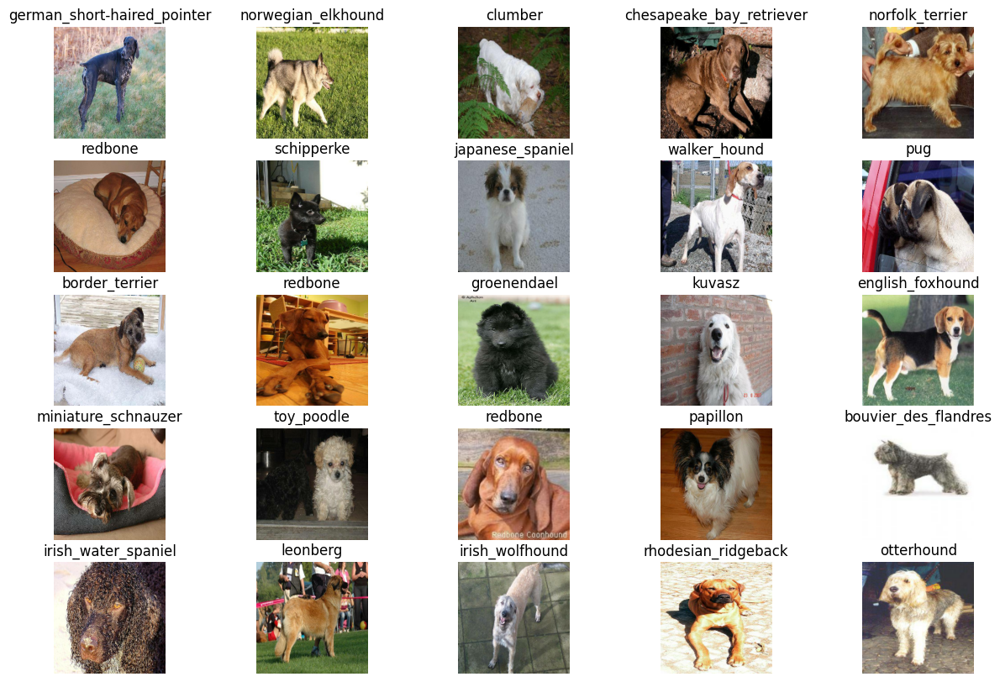

In [ ]:
# Now let's visualize our data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

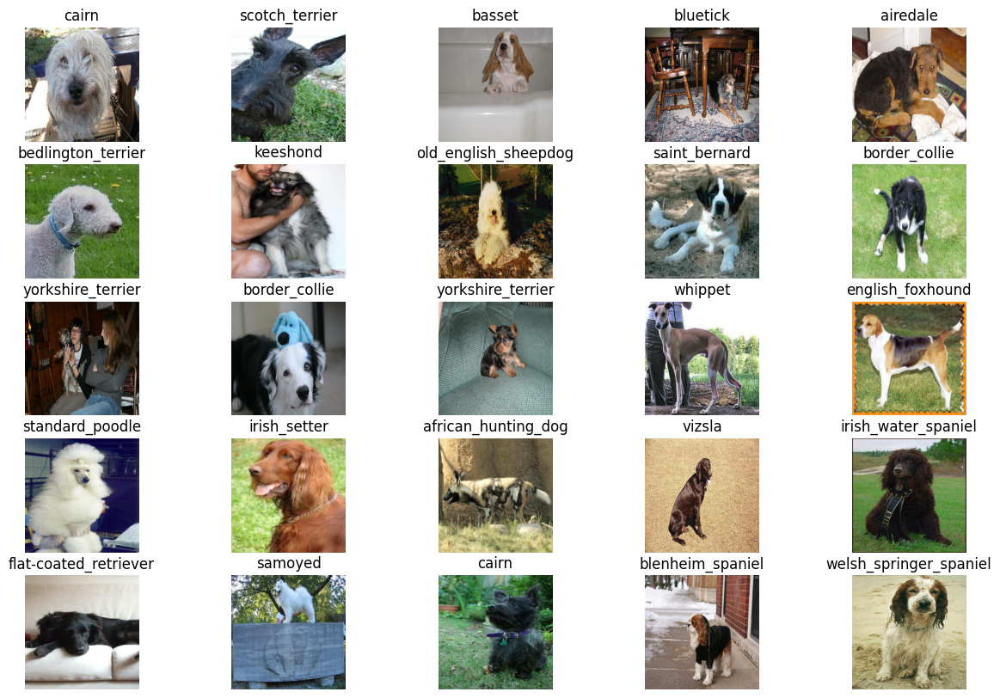

In [ ]:
# Now let's visualize our validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model
+ The input shape (our images shape, in the form of Tensors) to our model.
+ The output shape (image labels in the form of Tensors) of our model.
+ The URL of the model we want to use from TensorFlow Hub. https://www.kaggle.com/models/google/mobilenet-v2

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

Now we've got our inputs, outputs and model ready to go. Let's put them into a Keras deep learning model!

Knowing this, let's create a function which:

+ Takes the input shape, output shape and model we've chosen as parameters.
+ Define the layers in Keras model in sequential fashion (do this first, then that, then that)
+ Compile the model (say it should be evaluated and improved)
+ Builds the model (tells the model the input shape it'll be getting).
+ Returns the model.

All these steps can be found here: https://www.tensorflow.org/guide/keras

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper function a model can use during to do such things as save its progress, check a model's  progress or stop training early if a model stops improving.

The two callbacks we are going to add are TensorBoard callback and an Early Stopping callback.

### TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:

1. Load the TensorBoard Notebook extension.✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.✅
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard Logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callbacks

Early stopping callbacks helps prevent model from overfitting by stopping training if a certain evaluation metric stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

So our ifrst model ins only going to train on the first 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU Available" if tf.config.list_physical_devices("GPU") else "Not available :(")

GPU Available


Let's create a function that trains our model

+ Crete a model using `create_model()`
+ Setup a TensorBoard callback using `create_tensor_board_callback()`.
+ Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
+ Return the model


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the train model
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 161s 144ms/step - loss: 4.5512 - accuracy: 0.1200 - val_loss: 3.3903 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 2s 90ms/step - loss: 1.6155 - accuracy: 0.6950 - val_loss: 2.1476 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 2s 95ms/step - loss: 0.5598 - accuracy: 0.9413 - val_loss: 1.6570 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 3s 123ms/step - loss: 0.2560 - accuracy: 0.9800 - val_loss: 1.4790 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 2s 89ms/step - loss: 0.1498 - accuracy: 0.9950 - val_loss: 1.4074 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 2s 91ms/step - loss: 0.1027 - accuracy: 0.9987 - val_loss: 1.3554 - val_accuracy: 0.6600
Epoch

**Question:** It looks like our model is overfitting because its performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directly we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 79ms/step


array([[2.47379462e-03, 9.02809770e-05, 4.35442850e-03, ...,
        4.22957091e-04, 2.02921248e-04, 4.10035765e-03],
       [1.52777345e-03, 7.79054069e-04, 4.10483871e-03, ...,
        5.36109961e-04, 1.10536988e-03, 3.15109006e-04],
       [3.00004967e-06, 1.87355196e-04, 1.10574794e-04, ...,
        9.45040738e-05, 3.43266802e-05, 3.57705168e-04],
       ...,
       [3.53206656e-06, 2.73920159e-05, 2.11288818e-04, ...,
        5.90616992e-06, 2.06528712e-05, 1.05307488e-04],
       [3.10081826e-03, 4.78162547e-04, 1.49230822e-04, ...,
        1.50073873e-04, 1.03012928e-04, 5.84413670e-03],
       [2.19361536e-04, 1.59393858e-05, 1.37154001e-03, ...,
        5.82566834e-04, 3.61830438e-03, 3.87006367e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([2.47379462e-03, 9.02809770e-05, 4.35442850e-03, 1.69637220e-04,
       1.27036800e-03, 6.42507948e-05, 2.77366657e-02, 3.81758029e-04,
       6.01697611e-05, 5.08724654e-04, 6.94461778e-05, 8.96773068e-04,
       6.60143560e-04, 4.51053966e-05, 5.91982563e-04, 2.56781466e-04,
       3.80015372e-05, 1.48750126e-01, 1.56931947e-05, 1.16033356e-04,
       1.21547596e-03, 5.87191171e-05, 2.68632994e-05, 1.09617668e-03,
       1.24906037e-05, 1.98222784e-04, 2.45729193e-01, 6.13557757e-04,
       9.49047855e-04, 5.71754390e-05, 7.01607278e-05, 1.36233005e-03,
       7.50194304e-04, 1.62101078e-05, 1.91731859e-04, 4.19767201e-02,
       2.22242252e-05, 3.22414184e-04, 1.22957363e-05, 9.18815422e-05,
       1.48348627e-03, 1.81831874e-05, 5.94683042e-05, 3.57456942e-04,
       1.99999431e-05, 1.74327783e-04, 1.50750257e-05, 7.22010969e-04,
       2.20625428e-03, 7.07078361e-05, 1.08555192e-04, 1.01207290e-04,
       4.92925872e-04, 9.08537550e-06, 4.82033356e-05, 3.23412998e-04,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First Prediction

index = 1
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Prediction label : {unique_breeds[np.argmax(predictions[index])]}")

[1.52777345e-03 7.79054069e-04 4.10483871e-03 6.96047035e-04
 4.35441354e-04 1.70637577e-04 3.06956889e-03 7.76316621e-04
 4.26522602e-04 4.72784089e-03 2.43733753e-03 5.25835130e-05
 1.42188917e-04 5.46240517e-05 5.87975082e-04 9.25461427e-05
 1.87834690e-03 2.46712891e-03 1.20564298e-04 4.50305000e-04
 5.53646707e-04 2.11481849e-04 3.00310403e-05 4.19292948e-04
 7.91834536e-05 9.78488461e-05 2.00607941e-01 7.37050408e-03
 5.84661211e-05 1.42352670e-04 7.47407321e-05 1.55807461e-03
 5.52751648e-04 2.74092890e-05 8.15575826e-04 3.88112967e-04
 8.14656159e-05 3.18550295e-03 4.67871752e-04 5.67185401e-04
 2.39920351e-04 7.18040857e-04 2.39926871e-04 3.76253593e-04
 5.68347867e-04 3.47693567e-03 6.31007890e-04 3.56626086e-04
 7.43370876e-02 4.01961297e-05 2.73169077e-04 2.84212438e-04
 1.63327331e-05 7.61932097e-05 2.74392078e-04 5.79927163e-03
 9.62426711e-05 7.25739030e-03 8.61291250e-04 3.67309223e-03
 1.89962739e-03 3.30722992e-06 4.89134873e-05 9.90675253e-05
 1.57914916e-03 6.545896

Having the above functionality is great but, we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as `confidence levels`

In [26]:
# Turn the prediction probabiliteis into respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Turn the prediction probabiliteis into respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now since our validation data is still in batch dataset, we'll have to unbatchify it to make preidctions on the validation images and then compare it to those predictions to the validation labels  (truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return (images, labels)

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
+ Prediction labels
+ Validation labels (truth labels)
+ Validation images

Let's make some functions to make these all a bit more visualize.

We'll create a function which:
+ Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
+ Convert the prediction probabilities into a predicted label. ✅
+ Plot the predicted label, its predicted probability, the truth label and the target image on the single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample "n"
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending upon whether the prediction is correct or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change the plot title to be predicted, probability of predictions and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                              np.max(pred_prob)*100,
                              true_label),
                              color=color)

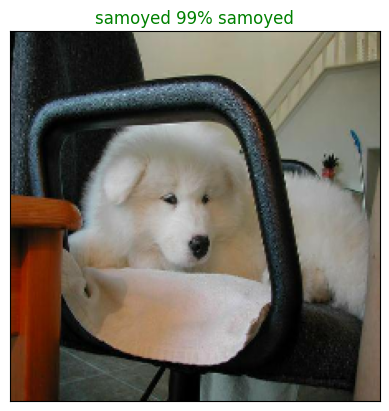

In [ ]:
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images = val_images,
          n = 152)

Now we've got 1 function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

+ Take an input of prediction probabilities array and a ground truth array and an integer.
+ Find the prediction using `get_pred_label()`.
+ Find the top 10:
    + Prediction probabilities indexes.
    + Prediction probabilities values.
    + Prediction labels.

+ Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]       # slicing the sorted indices array to select the last 10 indices from the sorted array and then reversing it.
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),      # create a numpy array evenly spaced starting from zero to the length of elements in the top_10_pred_labels
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

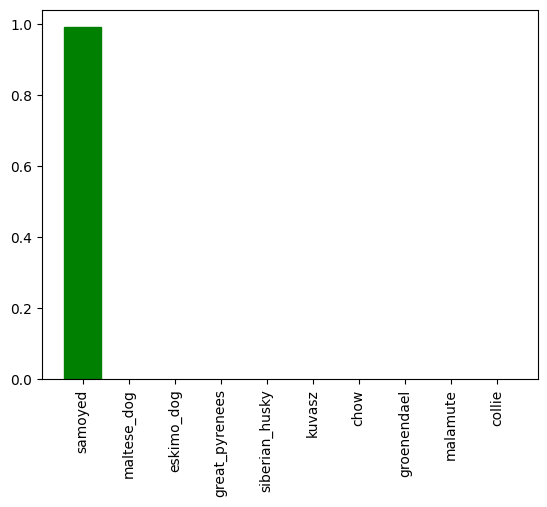

In [ ]:
plot_pred_conf(prediction_probabilities= predictions,
               labels= val_labels,
               n=152)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

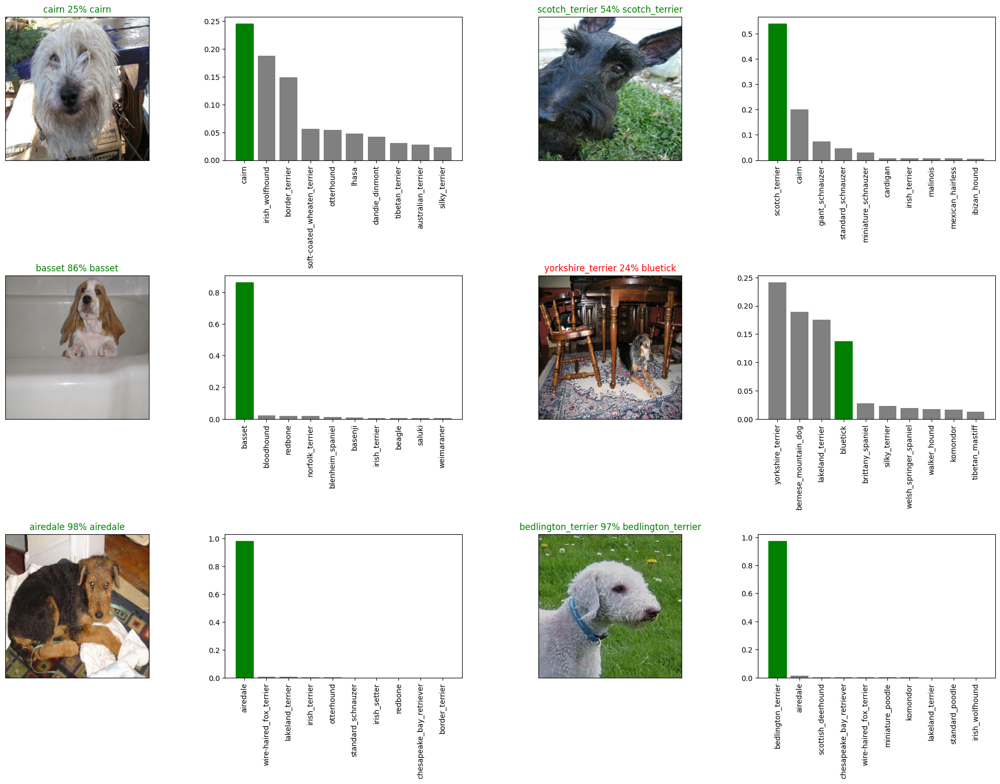

In [ ]:
# Let's checkout a few predictions and their values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

### Plotting Confusion Matrix

In [ ]:
# Turning predictions into labels
pred_labels = []
for i in range(len(predictions)):
  pred_labels.append(get_pred_label(predictions[i]))

pred_labels[:10]

['cairn',
 'scotch_terrier',
 'basset',
 'yorkshire_terrier',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'collie']

In [ ]:
val_labels[:10]

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie']

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [16]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240104-19261704396394-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240104-19261704396394-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20231219-21171703020622-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20231219-21171703020622-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.2418 - accuracy: 0.6900


[1.2418133020401, 0.6899999976158142]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 111ms/step - loss: 1.3157 - accuracy: 0.6650


[1.315738558769226, 0.6650000214576721]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 34s 92ms/step - loss: 1.3264 - accuracy: 0.6732
Epoch 2/100
320/320 [==============================] - 26s 82ms/step - loss: 0.3982 - accuracy: 0.8819
Epoch 3/100
320/320 [==============================] - 27s 83ms/step - loss: 0.2368 - accuracy: 0.9334
Epoch 4/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1538 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1047 - accuracy: 0.9795
Epoch 6/100
320/320 [==============================] - 35s 107ms/step - loss: 0.0757 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 29s 91ms/step - loss: 0.0590 - accuracy: 0.9912
Epoch 8/100
320/320 [==============================] - 28s 88ms/step - loss: 0.0455 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0388 - accuracy: 0.9949
Epoch 10/100
320/320 [==============================] - 28s 88ms/step -

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240104-19381704397133-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20240104-19381704397133-full-image-set-mobilenetv2-Adam.h5'

In [22]:
# Load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/Dog Vision/models/20231220-16131703088787-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20231220-16131703088787-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

+ Get the test image filenames. ✅
+ Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to True (since the test data doesn't have labels). ✅
Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e3a2e1a4c44509d7aa7777d88c5cd45a.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6a544a538088cc3f73b432a2da90134.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e26901a9e04f0ba89765fb9b9b7f675f.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e57a2bee790b512b2ba824b26f3f93fd.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df9ee3c663b1f2ca84781c09fa8c31f8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddfbebe13aa8fba30f347c58466215df.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e17defebd1b8fc39e9c3c10df3c2e3de.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6cbd88414627be43910a1977ce28595.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e443bb594a89ab5fa1266748d6b41648.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 168s 503ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions[:10]

array([[3.3650875e-09, 5.2457236e-11, 1.1562558e-11, ..., 1.0297555e-11,
        3.5534395e-10, 6.0586257e-07],
       [1.8933178e-12, 5.1533644e-10, 2.2279949e-08, ..., 6.9999696e-05,
        8.4911029e-09, 6.8470832e-12],
       [1.6546443e-09, 5.0274494e-12, 4.8451948e-10, ..., 9.4961053e-01,
        1.5160849e-07, 7.9102463e-10],
       ...,
       [7.8114482e-08, 1.7595961e-06, 2.1675426e-09, ..., 9.8144410e-05,
        1.1336304e-04, 6.5238218e-08],
       [7.8973945e-12, 4.0482808e-14, 1.6886807e-12, ..., 1.7579760e-10,
        4.7620731e-12, 4.1348328e-10],
       [2.1512163e-09, 7.1894401e-06, 8.6428455e-11, ..., 4.9789560e-07,
        3.3723738e-12, 2.1736857e-10]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

+ Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
+ Add data to the ID column by extracting the test image ID's from their filepaths.
+ Add data (the prediction probabilites) to each of the dog breed columns.
+ Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a2e1a4c44509d7aa7777d88c5cd45a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6a544a538088cc3f73b432a2da90134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e26901a9e04f0ba89765fb9b9b7f675f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e57a2bee790b512b2ba824b26f3f93fd,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df9ee3c663b1f2ca84781c09fa8c31f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a2e1a4c44509d7aa7777d88c5cd45a,3.365088e-09,5.245724e-11,1.156256e-11,1.070340e-09,1.874757e-10,6.032836e-09,2.473953e-10,1.195864e-11,5.870992e-10,...,9.857246e-09,4.225169e-10,2.426455e-09,5.346870e-11,4.067638e-11,3.690346e-03,1.565520e-09,1.029756e-11,3.553439e-10,6.058626e-07
1,e6a544a538088cc3f73b432a2da90134,1.893318e-12,5.153364e-10,2.227995e-08,6.026698e-14,1.091009e-12,1.526938e-15,3.742083e-10,1.768169e-08,3.117685e-07,...,4.438639e-11,5.637126e-08,3.113520e-12,1.227861e-14,9.643078e-14,3.807153e-09,4.648410e-10,6.999970e-05,8.491103e-09,6.847083e-12
2,e26901a9e04f0ba89765fb9b9b7f675f,1.654644e-09,5.027449e-12,4.845195e-10,2.991992e-10,9.649564e-09,1.725333e-09,1.848636e-11,4.753371e-06,1.185236e-08,...,7.517723e-10,4.734505e-08,2.527665e-09,1.180065e-07,4.586099e-09,2.867158e-11,1.146561e-07,9.496105e-01,1.516085e-07,7.910246e-10
3,e57a2bee790b512b2ba824b26f3f93fd,3.150509e-10,7.167509e-11,8.120931e-09,5.862715e-12,2.650743e-14,5.414844e-14,2.768882e-11,2.016035e-12,6.066495e-12,...,2.570131e-13,2.367292e-12,1.791661e-14,7.341045e-13,1.234421e-13,2.243958e-13,2.781643e-08,5.550839e-14,1.435316e-10,3.292892e-11
4,df9ee3c663b1f2ca84781c09fa8c31f8,3.091147e-14,4.188324e-14,3.467565e-13,1.733385e-13,2.723794e-14,3.856198e-15,3.825183e-14,6.478624e-13,3.402688e-14,...,9.111320e-16,8.128848e-10,6.688763e-14,1.470731e-14,6.226905e-16,3.479386e-16,7.460342e-15,1.742470e-10,3.572730e-12,1.716644e-14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,076bc1ea1425b47d2ed010c3fb3d8617,9.887899e-01,4.111732e-07,6.563158e-07,3.035550e-11,3.282778e-10,7.711762e-11,4.751619e-05,1.893133e-10,6.237378e-11,...,5.571982e-09,3.585321e-09,5.168584e-10,9.512920e-10,9.496980e-11,1.501721e-10,3.793049e-09,1.346336e-08,2.544493e-06,1.084226e-05
10353,07ad1a0d014793de8c2e104b801c6cda,7.444157e-12,4.336506e-10,3.961956e-12,9.998023e-01,7.905013e-09,5.136995e-10,2.624502e-09,8.013850e-12,3.799948e-13,...,3.941406e-10,1.798248e-13,1.019566e-08,1.054882e-09,5.814392e-12,6.491565e-10,7.868218e-13,3.603021e-09,1.884807e-05,4.062076e-11
10354,092376c380c9d09c4af6e98ef2278925,3.005491e-10,2.925015e-10,8.546486e-12,3.962222e-09,4.287091e-10,1.250970e-10,1.514444e-10,2.514750e-08,3.883737e-11,...,4.289782e-10,3.470479e-11,2.640659e-12,3.064120e-10,3.313463e-11,1.846372e-09,1.328040e-11,1.177891e-13,1.040250e-10,2.025384e-10
10355,085b91ca1ad46fcd9edd0edbe2b1385f,3.076255e-06,1.885480e-07,3.146687e-10,3.645181e-11,1.045506e-08,5.574412e-13,3.463761e-09,1.910046e-12,1.751376e-09,...,3.155236e-08,3.951468e-14,2.961087e-11,1.559906e-07,3.271826e-09,1.415672e-13,1.198989e-11,2.901555e-12,5.388762e-14,3.479654e-12


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [14]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [15]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog-1.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-2.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-3.jpg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-4.jpg']

In [20]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [23]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 3s 3s/step


In [24]:
custom_preds.shape

(4, 120)

In [31]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'german_shepherd', 'tibetan_mastiff', 'siberian_husky']

In [32]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

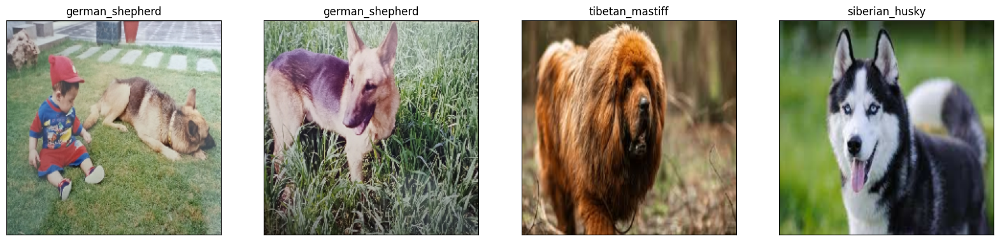

In [37]:
# Check custom image predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)